In [1]:
%load_ext autoreload
%autoreload 2

import os 
import shutil
import numpy as n
from datetime import date
from matplotlib import pyplot as plt
import time
import napari

In [2]:
os.chdir('/home/ali/packages/s2p-lbm/')

from suite3d.job import Job
from suite3d import lbmio, utils, ui
from suite3d import tiff_utils as tfu
from suite3d import file_utils as flu

In [3]:
job_params = {    
    'notch_filt' :     None,
    'planes' :         n.concatenate([n.arange(0,30,2), n.arange(1,31,2)]),
    'n_ch_tif' : 30,
    'convert_plane_ids_to_channel_ids' : False,
    
    'n_init_files' :   1,
    'init_file_pool' : None,
    'init_file_sample_method': 'random',
    
    'subtract_crosstalk' : True,
    'override_crosstalk' : None,
    'crosstalk_n_planes' : 10, 
    
    'nonrigid' : True,
    'smooth_sigma' : 1.15,
    'maxregshift' : 0.15,
    'reg_filter_pcorr' : 1,
    'generate_sample_registered_bins' : False,

    'dtype' : n.float32,
    'tif_batch_size' : 1,
}



In [10]:
subjects_dir =   '/mnt/zortex-subjects/'
expt_info = { 
    'subject':         'AH012',
    'date' :          '2024-05-17',
    'expnum' :         [4],}

tifs, si_params, exp_str = flu.find_exp(subjects_dir, **expt_info, verbose=False)

job_params['fs'] = si_params['vol_rate']

savedir = os.path.join('/mnt/md0/runs', expt_info['subject'], expt_info['date'])
os.makedirs(savedir, exist_ok=True)

In [11]:
channel_idxs = n.concatenate([n.arange(0,30,2), n.arange(1,31,2)])

mov_raw = lbmio.load_and_stitch_tifs(tifs[:1], planes = channel_idxs, convert_plane_ids_to_channel_ids=False)

im = mov_raw.mean(axis=1)

im.shape

Loading /mnt/zortex-subjects/AH012/2024-05-17/4/2024-05-17_4_AH012_2P_00001_00001.tif
Loaded 1 files, total 4.51 GB


(30, 800, 1008)

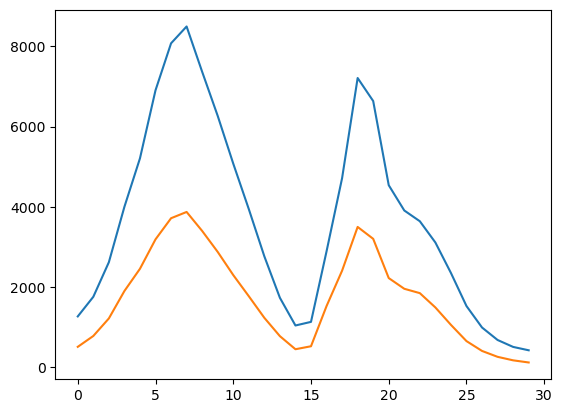

In [12]:
plt.plot(im.mean(axis=(1,2)))
plt.plot(im.std(axis=(1,2)))

In [13]:
snip = mov_raw[0][:, 425:450, 320:350]

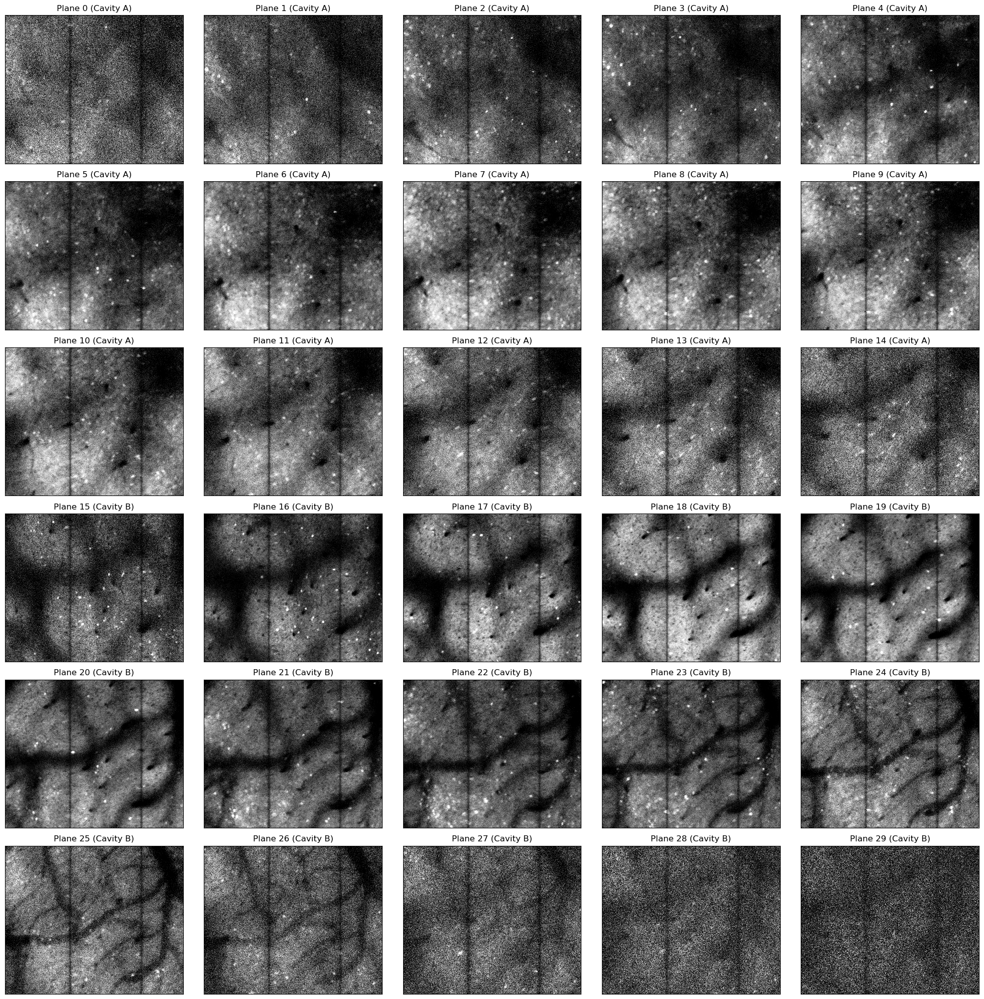

In [14]:
f,axs = plt.subplots(6,5, figsize=(20,20))
plane_idx = 0
for i in range(len(axs)):
    for j in range(len(axs[0])):
        ax = axs[i][j]
        tfu.show_tif(im[plane_idx, 400:700, 300:660],vminmax_percentile=(5,99.9), cbar=False, ax=ax)
        ax.set_title("Plane %d (Cavity %s)" % (plane_idx, 'A' if plane_idx < 15 else 'B'))
        plane_idx += 1       
plt.tight_layout()

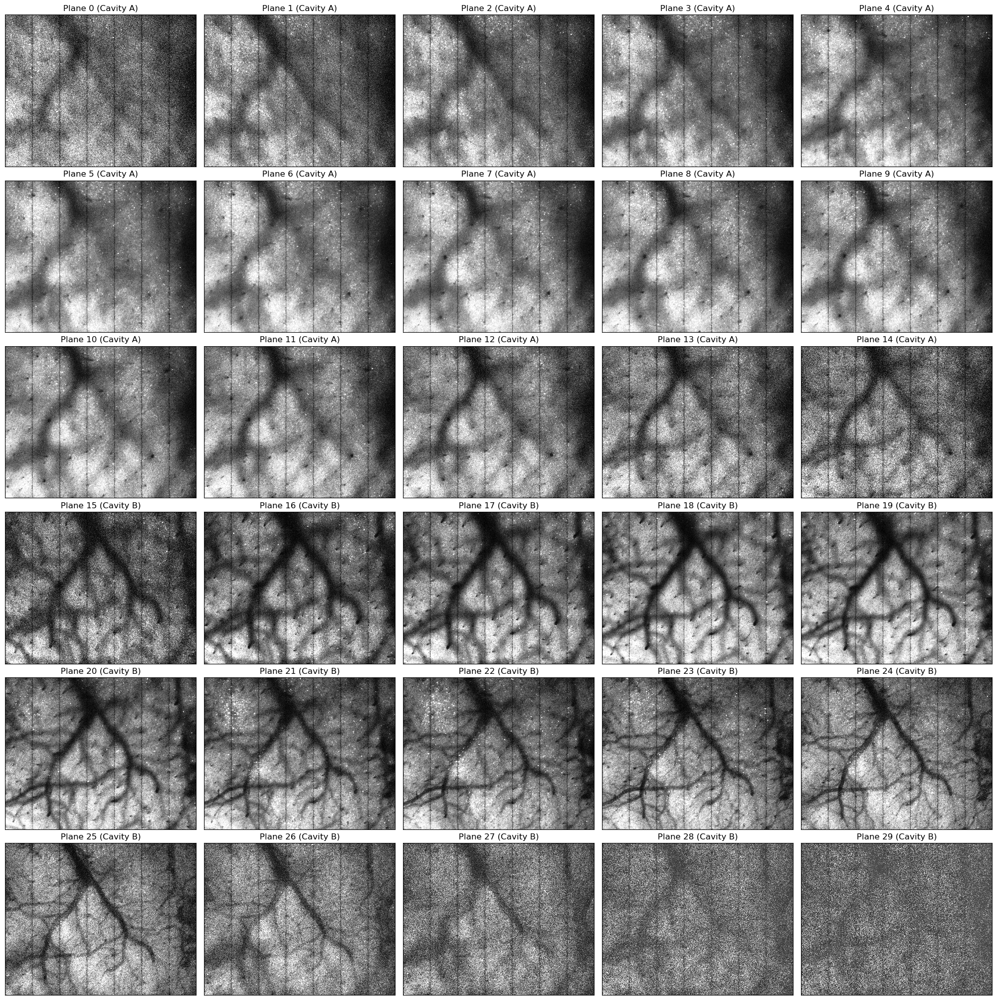

In [15]:
f,axs = plt.subplots(6,5, figsize=(20,20))
plane_idx = 0
for i in range(len(axs)):
    for j in range(len(axs[0])):
        ax = axs[i][j]
        tfu.show_tif(im[plane_idx],vminmax_percentile=(0,99.5), cbar=False, ax=ax)
        ax.set_title("Plane %d (Cavity %s)" % (plane_idx, 'A' if plane_idx < 15 else 'B'))
        plane_idx += 1       
plt.tight_layout()

#### 